# Zadanie 2

Juliusz Wasieleski, grupa 1, rok 2, Informatyka WIEiT

Listopad 2022

## Import bibliotek

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
from time import perf_counter
from functools import partial
from copy import deepcopy
sns.set_style('darkgrid')

### A

## Generuję i wizualizuję zbiory dla podpunktu 1

In [2]:
data_a = np.random.uniform(-100,100,size = [100,2])
df_a = pd.DataFrame(data=data_a, columns=['X','Y'])

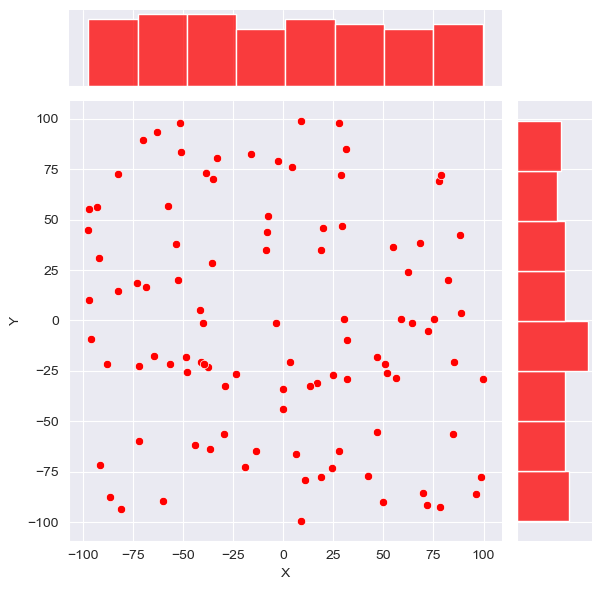

In [3]:
sns.jointplot(data=df_a,x='X',y='Y',kind='scatter',height=6,color='red')

### B

In [4]:
data_b = [None for _ in range(100)]
for i in range(100):
    angle = 2 * np.pi * np.random.random_sample()
    data_b[i] = [10 * np.cos(angle),10 * np.sin(angle)]
df_b = pd.DataFrame(data=data_b, columns=['X','Y'])

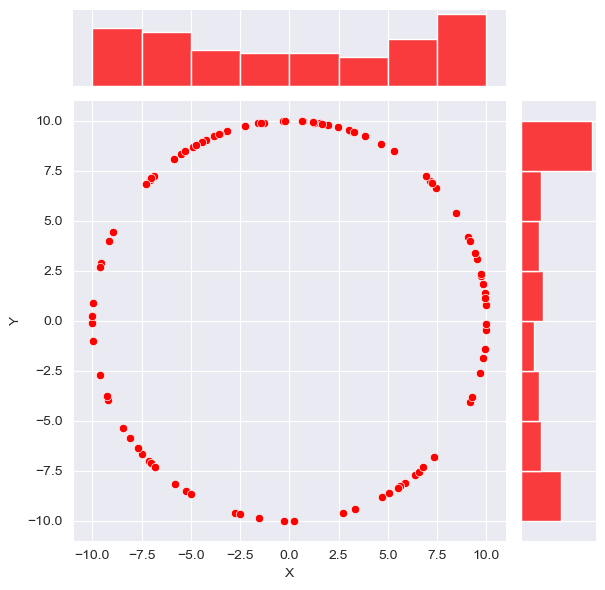

In [5]:
sns.jointplot(data=df_b,x='X',y='Y',kind='scatter',height=6,color='red')

### C

In [6]:
data_c = []
for i in range(100):
    type = np.random.randint(0,4)
    #left side
    if type==0:
        point = [-10,np.random.uniform(-10,10)]
    #top side
    elif(type==1):
        point = [np.random.uniform(-10,10),10]
    #right side
    elif(type==2):
        point = [10,np.random.uniform(-10,10)]
    #bottom side
    else:
        point = [np.random.uniform(-10,10),-10]
    data_c.append(point)
df_c = pd.DataFrame(data=data_c,columns=['X','Y'])

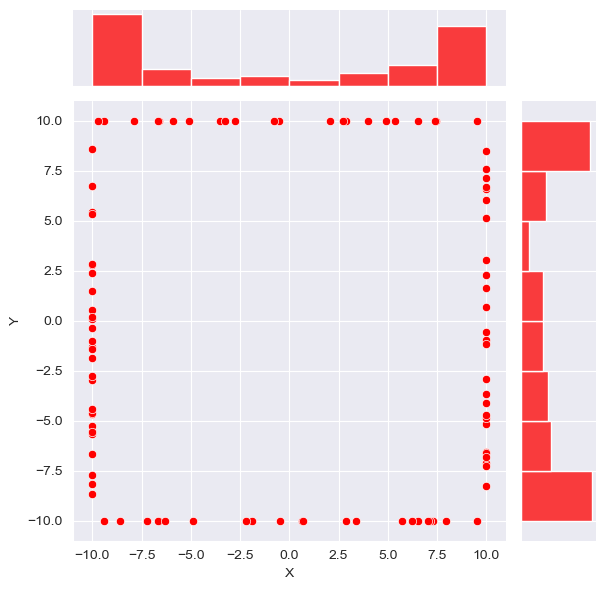

In [7]:
sns.jointplot(data=df_c,x='X',y='Y',kind='scatter',height=6,color='red')

### D

In [8]:
data_d = [[0,0],[10,0],[10,10],[0,10]]
for i in range(25):
    type = np.random.randint(0,2)
    if(type==0):
        point=[0,np.random.uniform(0,10)]
    else:
        point=[np.random.uniform(0,10),0]
    data_d.append(point)
for i in range(20):
    type = np.random.randint(0,2)
    if(type==0):
        x=np.random.uniform(0,10)
        point=[x,x]
    else:
        x=np.random.uniform(0,10)
        point=[x,-x+10]
    data_d.append(point)
df_d = pd.DataFrame(data=data_d,columns=['X','Y'])

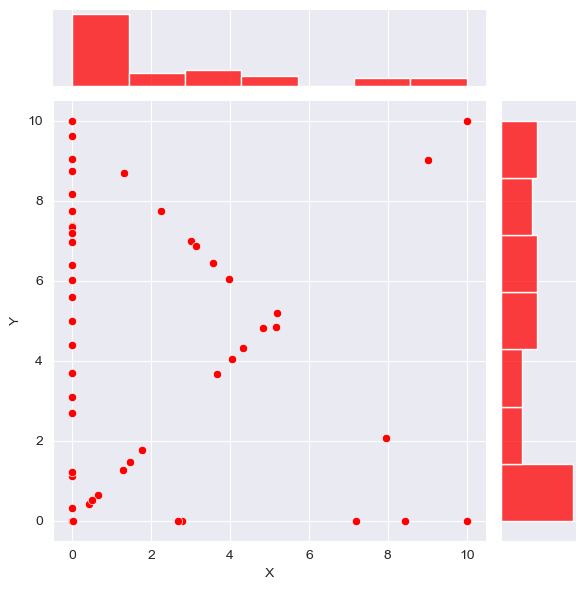

In [9]:
sns.jointplot(data=df_d,x='X',y='Y',kind='scatter',height=6,color='red')

## Generuję i wizualizuję zbiory z podpunktu 3

In [10]:
def data_a_parameters(num_of_points,ranges):
    new_data_a = np.random.uniform(ranges[0],ranges[1],size=[num_of_points,2])
    return new_data_a

In [11]:
new_data_a = data_a_parameters(40,[-50,50])
new_df_a = pd.DataFrame(data=new_data_a, columns=['X','Y'])

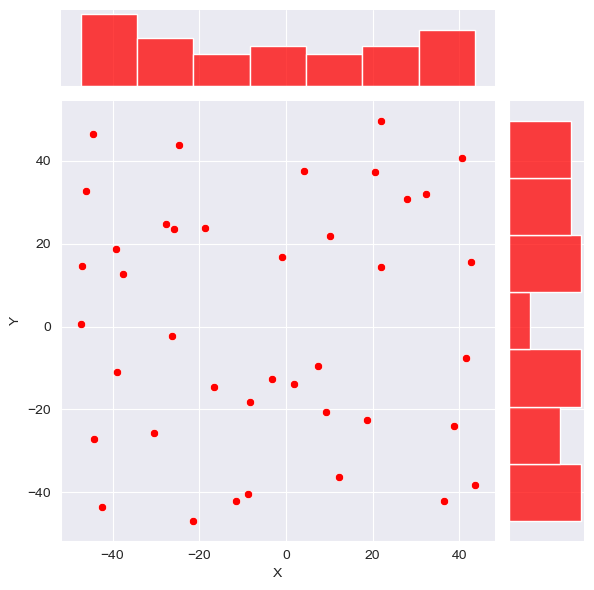

In [12]:
sns.jointplot(data=new_df_a,x='X',y='Y',kind='scatter',height=6,color='red')

### B

### A

In [13]:
def data_b_parameters(num_of_points,middle_point,radius):
    new_data_b = []
    for i in range(num_of_points):
        angle = 2*np.pi*np.random.random_sample()
        new_data_b.append([radius*np.cos(angle)+middle_point[0],radius*np.sin(angle)+middle_point[1]])
    return new_data_b

In [14]:
new_data_b = data_b_parameters(30,[50,50],120)
new_df_b = pd.DataFrame(data=new_data_b, columns=['X','Y'])

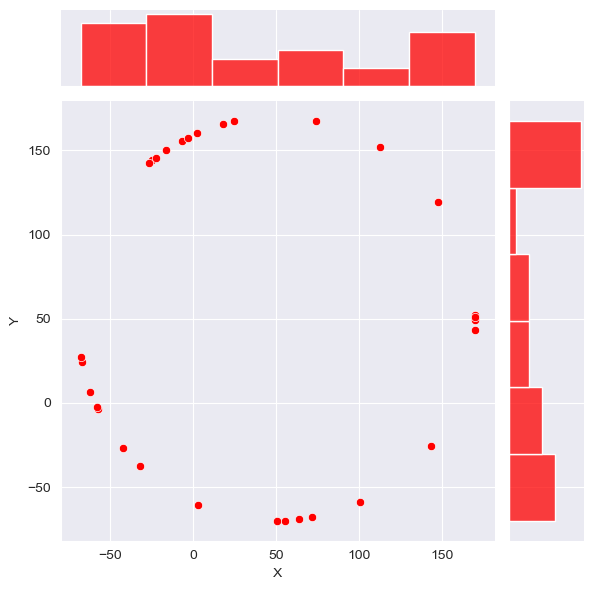

In [15]:
sns.jointplot(data=new_df_b,x='X',y='Y',kind='scatter',height=6,color='red')

### C

In [16]:
def data_c_parameters(num_of_points,leftLower,rightUpper):
    new_data_c = []
    for i in range(num_of_points):
        type = np.random.randint(0,4)
        #left side
        if type==0:
            point = [leftLower[0],np.random.uniform(leftLower[1],rightUpper[1])]
        #top side
        elif(type==1):
            point = [np.random.uniform(leftLower[0],rightUpper[0]),rightUpper[1]]
        #right side
        elif(type==2):
            point = [rightUpper[0],np.random.uniform(leftLower[1],rightUpper[1])]
        #bottom side
        else:
            point = [np.random.uniform(leftLower[0],rightUpper[0]),leftLower[1]]
        new_data_c.append(point)
    return new_data_c

In [17]:
new_data_c = data_c_parameters(40,[-30,-10],[50,40])
new_df_c=pd.DataFrame(data=new_data_c, columns=['X','Y'])

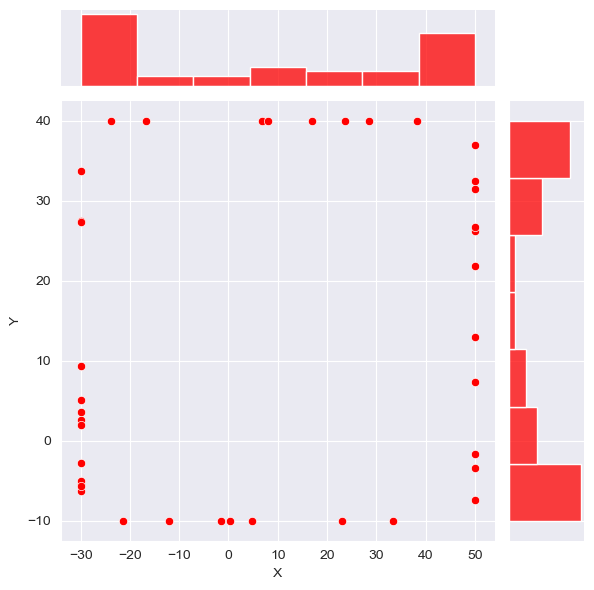

In [18]:
sns.jointplot(data=new_df_c,x='X',y='Y',kind='scatter',height=6,color='red')

### D

In [19]:
def data_d_parameters(points,axis_points,diagonal_points):
    new_data_d = []
    for i in range(axis_points):
        type = np.random.randint(0,2)
        if(type==0):
            point=[points[0][0],np.random.uniform(points[0][1],points[1][1])]
        else:
            point=[np.random.uniform(points[0][0],points[3][0]),points[3][1]]
        new_data_d.append(point)
    for i in range(diagonal_points):
        a=(points[3][1]-points[1][1])/(points[3][0]-points[1][0])
        b=points[1][1]-points[1][0]*a
        second_a=(points[2][1]-points[0][1])/(points[2][0]-points[0][0])
        second_b=points[0][1]-points[0][0]*second_a
        type = np.random.randint(0,2)
        if(type==0):
            x=np.random.uniform(points[0][0],points[2][0])
            point=[x,a*x+b]
        else:
            x=np.random.uniform(points[0][0],points[2][0])
            point=[x,second_a*x+second_b]
        new_data_d.append(point)
    return new_data_d

In [20]:
new_data_d = data_d_parameters([[-30,-10],[-30,30],[10,30],[10,-10]],40,20)
new_df_d = pd.DataFrame(data=new_data_d,columns=['X','Y'])

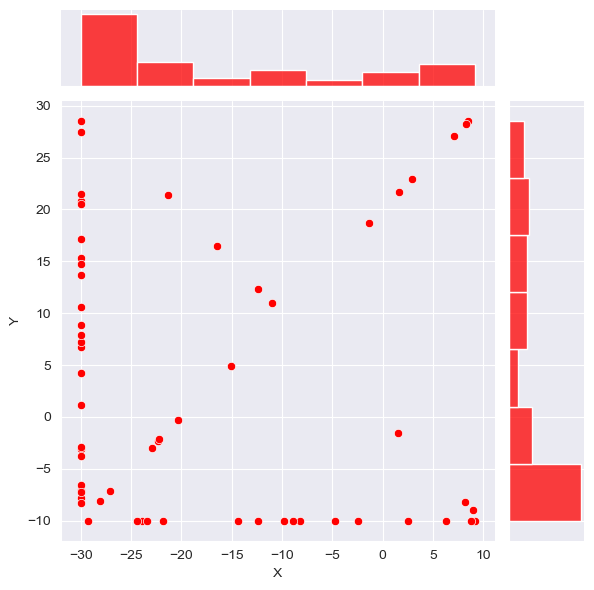

In [21]:
sns.jointplot(data=new_df_d,x='X',y='Y',kind='scatter',height=6,color='red')

# Implementacja oraz wizualizacja algorytmów Grahama i Jarvisa

### wizualiacja kolejnych kroków wyznaczania otoczki

In [22]:
def plot(points,hull,algorithm,final = False):
    plt.clf()
    points_df = pd.DataFrame(data=points, columns=['X','Y'])
    hull_df = pd.DataFrame(data=hull, columns=['X','Y'])
    x,y = points_df['X'],points_df['Y']
    plt.scatter(x,y,c='red')
    if(len(hull) != 0):
        for i in range(len(hull)):
            if (i == (len(hull) - 1)):
                if(final):
                    i = -1
                else:
                    break
            x1,y1 = hull[i]
            x2,y2 = hull[i + 1]
            plt.plot((x1,x2), (y1,y2), linestyle='-', color='blue')
            plt.scatter((x1,x2),(y1,y2), c='blue')
    plt.show()

### funkcje pomocnicze

In [23]:
epsilon=10 ** (-12)

In [24]:
def dist(a,b):
    return math.sqrt((a[0]-b[0])**2+(a[1]-b[1])**2)

def orient(a, b, c, epsilon=10e-12):
    orientation = det(a,b,c)
    if(orientation > epsilon):
        return 1
    elif(orientation < -epsilon):
        return -1
    else:
        return 0
    
def det(a,b,c):
    return (a[0] * b[1] * 1 +
           a[1] * 1 * c[0] +
           1 * b[0] * c[1] -
           1 * b[1] * c[0] -
           a[0] * 1 * c[1] -
           a[1] * b[0] * 1)


def partition(arr,point,left,right):
    i= left-1
    pivot = arr[right]
    
    for j in range (left, right):
        if orient(point, arr[j],pivot) == 1 or (orient(point, arr[j],pivot) == 0 and dist(point,arr[j]) > dist(point,pivot)):
            i+=1
            arr[i],arr[j] = arr[j],arr[i]
            
    arr[i+1],arr[right] = arr[right],arr[i+1]
    return i+1
    
def quick_sort(arr,point,left,right):
    if len(arr) == 1:
        return arr
    if left < right:
        pi = partition(arr,point,left,right)
        quick_sort(arr,point,left,pi-1)
        quick_sort(arr,point,pi+1,right)
        

### Implemetuję algorytm Grahama

In [25]:
def graham(points_org,vis=True,last_vis=True):
    
    points = deepcopy(points_org)  # kopijuę otrzymane punkty, deepcopy ze względu na dwuwymiarowość otrzymanej listy
    
    min_point = min(points, key = lambda x : (x[1], x[0]))  # szukam minimalnego punktu
    
    points.remove(min_point)
    
    quick_sort(points, min_point, 0, len(points)-1)   #sortuję punkty quick sortem mojej implementacji
    points = [min_point] + points
    
    stack = []    #wrzucam trzy punkty do stosu
    stack.append(points[0])
    stack.append(points[1])
    stack.append(points[2])
    
    i=3
    m=len(points)
    
    while(i<m):    # wykonuję krok 4 algorytmu Grahama, korzystając z wcześniejszego posortowania punktów
        if(orient(stack[-2],stack[-1],points[i])==0):
            stack.pop()
            stack.append(points[i])
            i+=1
        elif(orient(stack[-2],stack[-1],points[i])==1):
            stack.append(points[i])
            i+=1
        else:
            stack.pop()
        if(vis):
            plot(points,stack,"Graham")
            
    if(orient(stack[-2],stack[-1],min_point)==0):
        stack.pop()
    if(last_vis):
        plot(points,stack,"Graham",True)
        
    return stack

### Implementuję algorytm Jarvisa

In [26]:
def jarvis(points, vis=True, last_vis=True):
    points_cpy = deepcopy(points)
    
    min_point = min(points, key = lambda x : (x[1], x[0]))   #znajduję punkt od którego zaczynamy
    
    hull =[min_point]
    
    point_1 = min_point    #wykonuję algorytm Jarvisa
    point_2 = min_point
    point_3 = None
    while True:
        for i in range(len(points_cpy)):
            point_3 = points_cpy[i]
            if point_3 == point_2:
                continue
            if orient(point_1,point_2,point_3)==-1 :
                point_2=point_3
            elif orient(point_1,point_2,point_3)==0 and dist(point_1,point_2)<dist(point_1,point_3):  # punkty porównuję wyznacznikiem,a jeśli leżą na jednej liniii to sprawdzam ich odległości
                point_2=point_3
        if(hull[0]==point_2):
            break
        else:
            if(vis):
                plot(points,hull,"Jarvis",False)
            hull.append(point_2)
            point_1=point_2
            
    if(last_vis):
        plot(points,hull,"Jarvis",True)
    return hull          
    

# Wizualizuję kolejne kroki dla obu algorytmów i wszytskich zbiorów

## Zbiór A

### Algorym Grahama

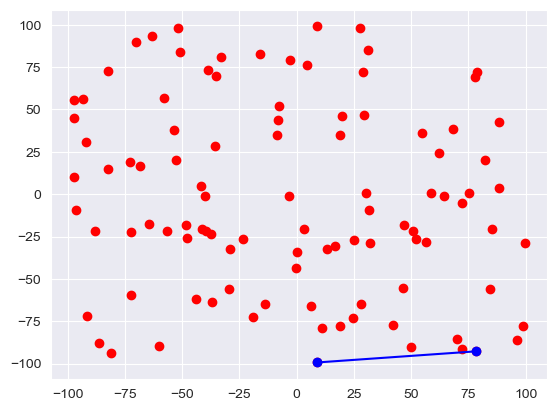

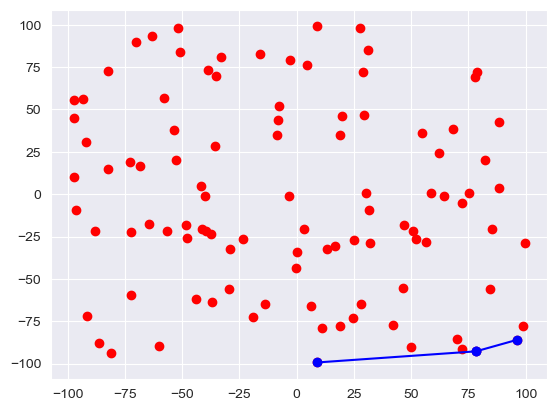

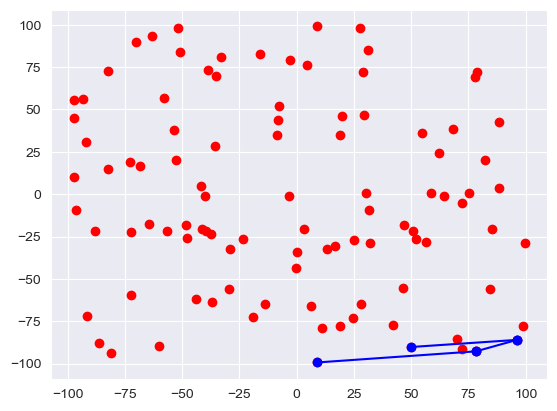

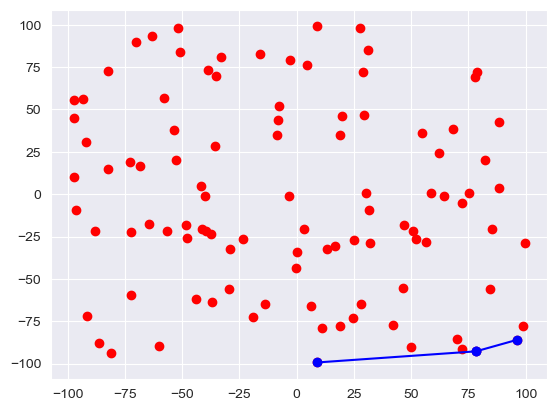

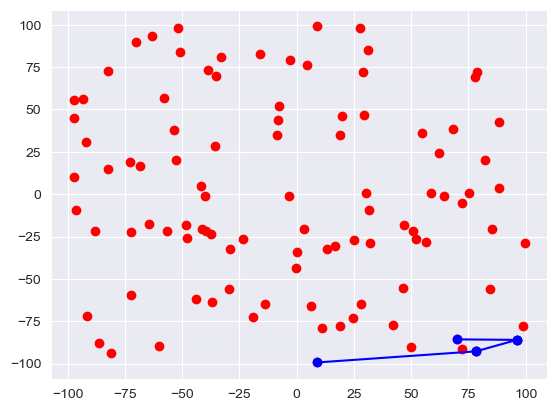

...

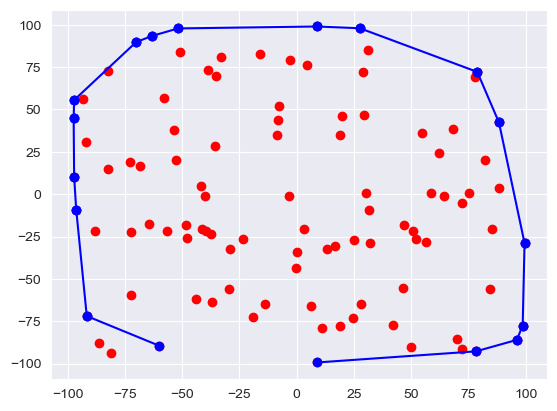

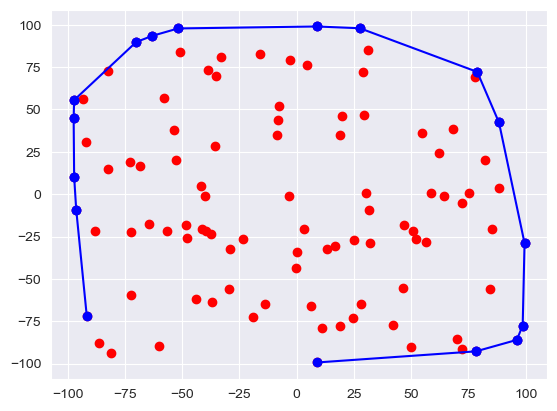

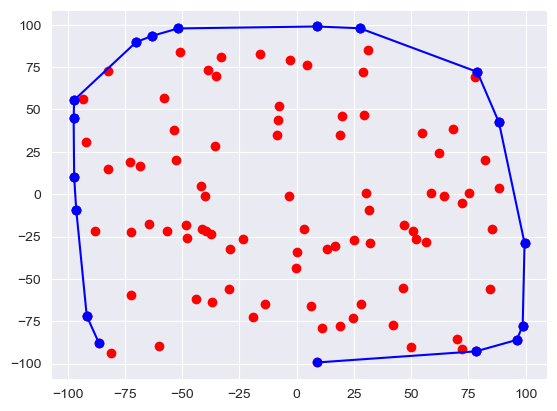

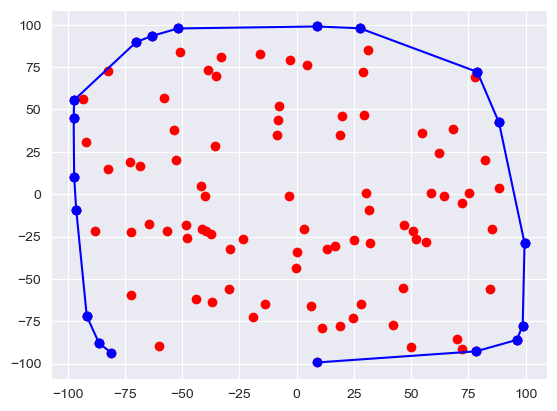

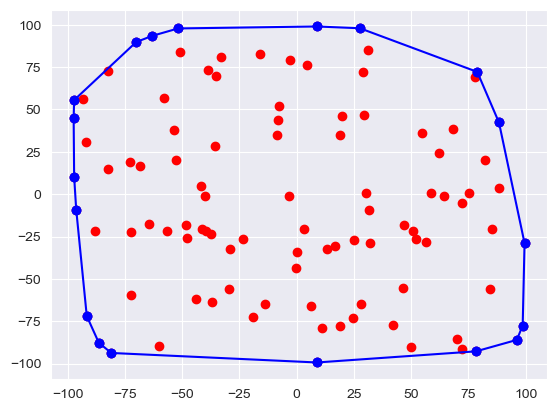

[[8.837392730150583, -99.32750319755095],
 [78.32772399676037, -92.75239474721016],
 [96.15163867270235, -86.00018503731657],
 [98.7136200784698, -77.53639835121248],
 [99.52864411913407, -28.914581619156607],
 [88.35454298863272, 42.30328651959013],
 [78.88114554933142, 72.14726257854844],
 [27.629689361315243, 97.91111006171099],
 [8.759867237157465, 98.96434462748962],
 [-51.79995433046074, 97.80292754750323],
 [-63.05690445803644, 93.44121392740107],
 [-70.1153576106393, 89.75523856799285],
 [-97.19325836546491, 55.531859276624374],
 [-97.41231866425835, 45.07436658161234],
 [-97.1924158522679, 10.231756818815569],
 [-96.29488405007369, -9.063307245971174],
 [-91.67674011035463, -71.92589291975065],
 [-86.40032928429109, -87.74104462340622],
 [-80.95482544420045, -93.71189996383906]]

In [27]:
graham(data_a.tolist(),True)

### Algorytm Jarvisa

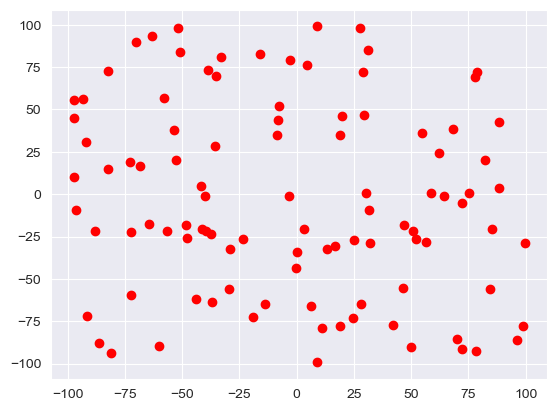

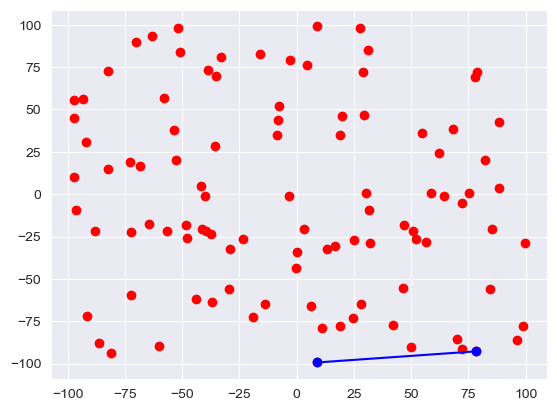

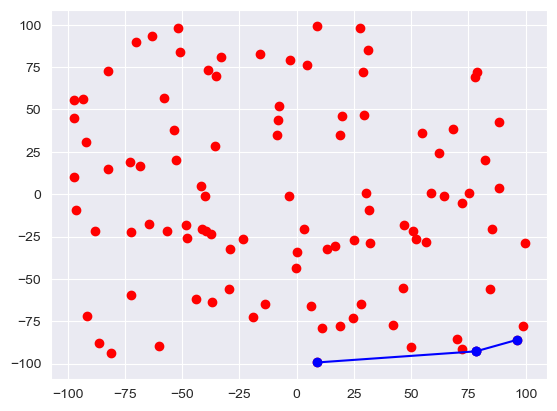

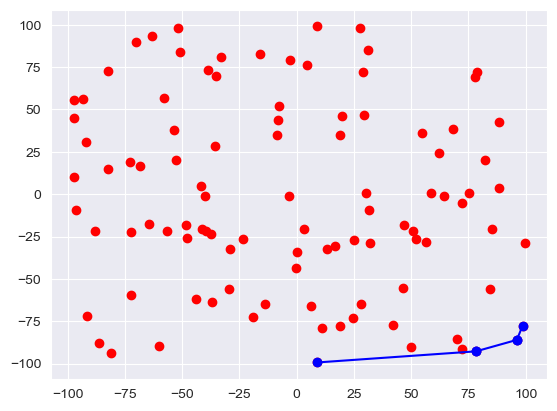

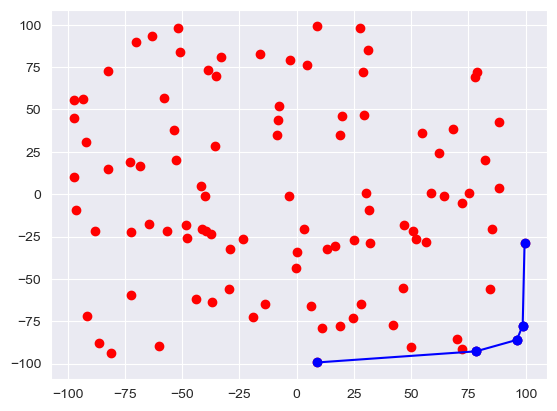

...

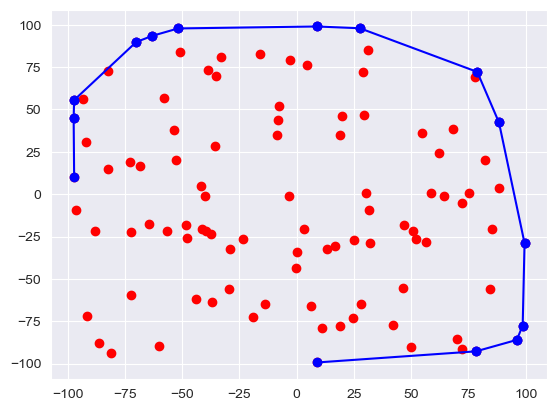

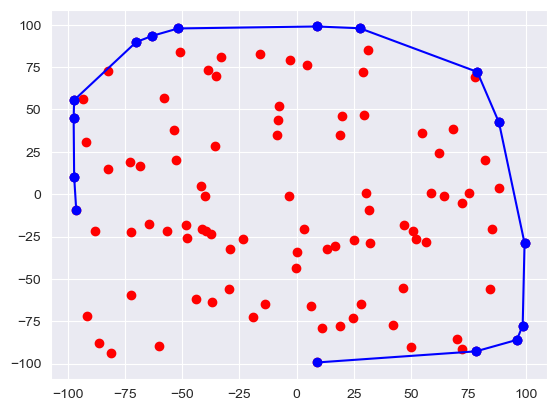

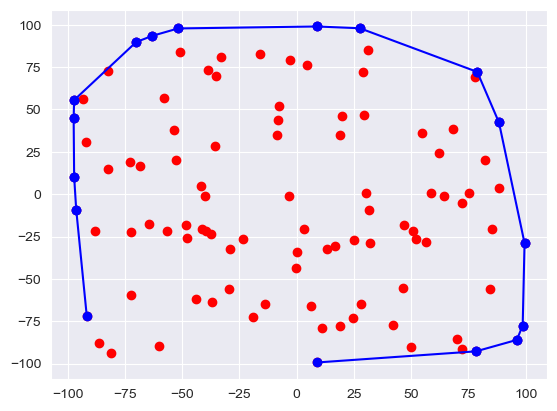

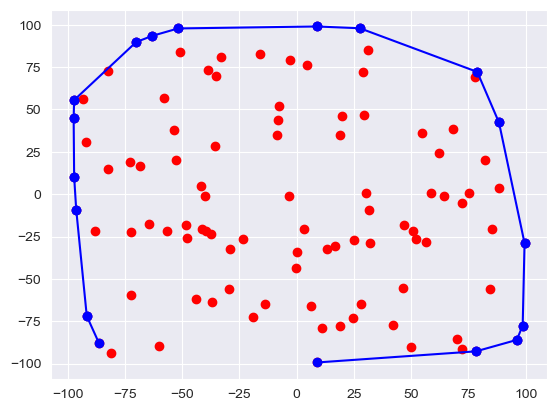

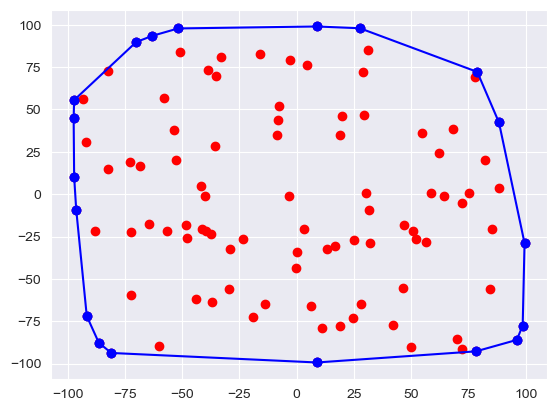

[[8.837392730150583, -99.32750319755095],
 [78.32772399676037, -92.75239474721016],
 [96.15163867270235, -86.00018503731657],
 [98.7136200784698, -77.53639835121248],
 [99.52864411913407, -28.914581619156607],
 [88.35454298863272, 42.30328651959013],
 [78.88114554933142, 72.14726257854844],
 [27.629689361315243, 97.91111006171099],
 [8.759867237157465, 98.96434462748962],
 [-51.79995433046074, 97.80292754750323],
 [-63.05690445803644, 93.44121392740107],
 [-70.1153576106393, 89.75523856799285],
 [-97.19325836546491, 55.531859276624374],
 [-97.41231866425835, 45.07436658161234],
 [-97.1924158522679, 10.231756818815569],
 [-96.29488405007369, -9.063307245971174],
 [-91.67674011035463, -71.92589291975065],
 [-86.40032928429109, -87.74104462340622],
 [-80.95482544420045, -93.71189996383906]]

In [28]:
jarvis(data_a.tolist(),True)

## Zbiór B

### Algorym Grahama

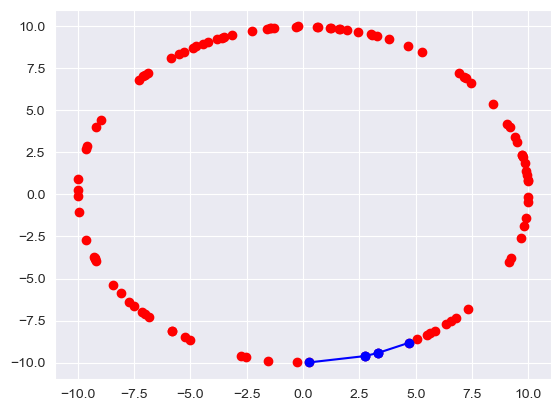

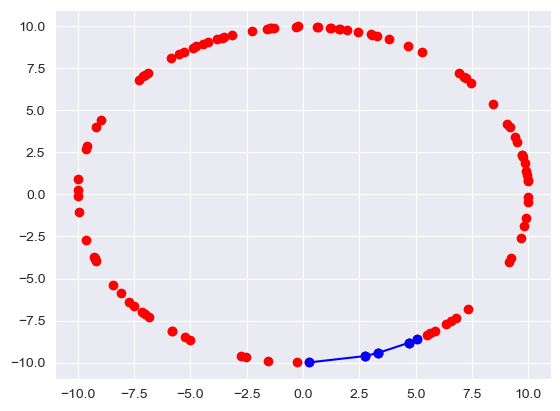

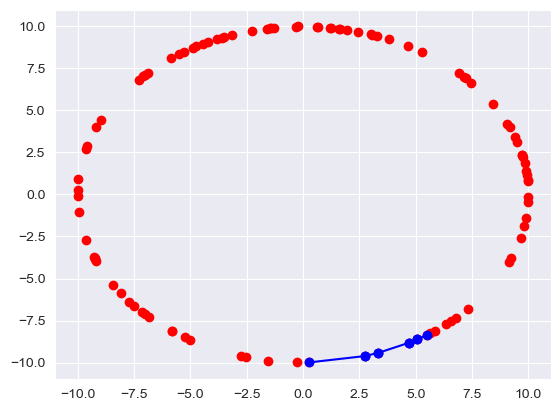

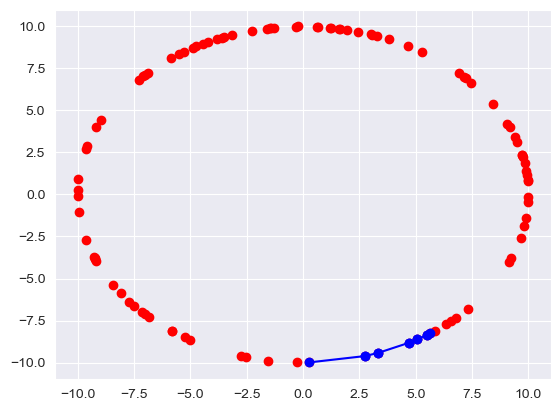

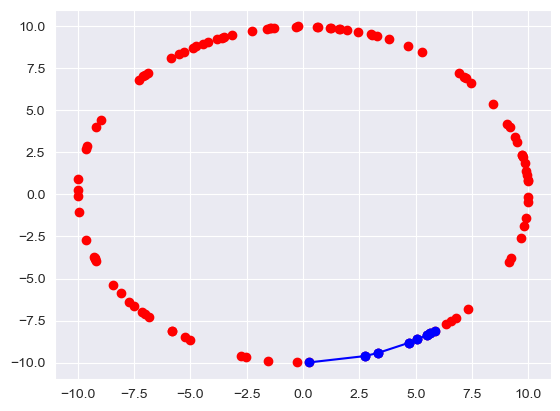

...

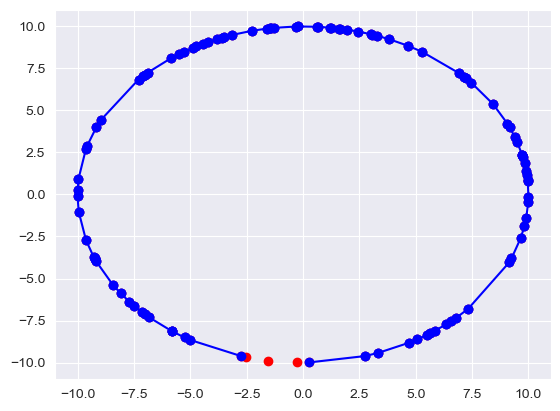

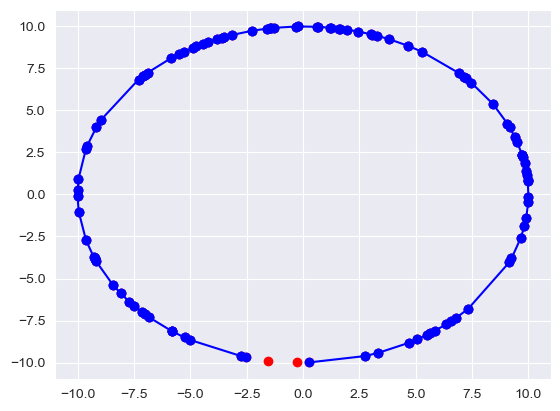

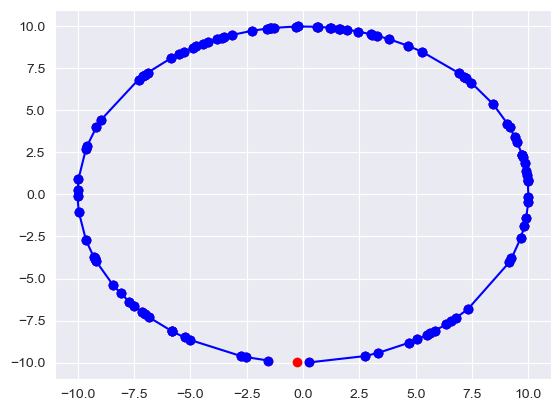

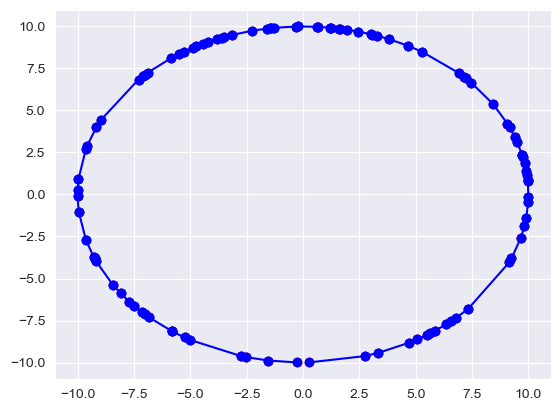

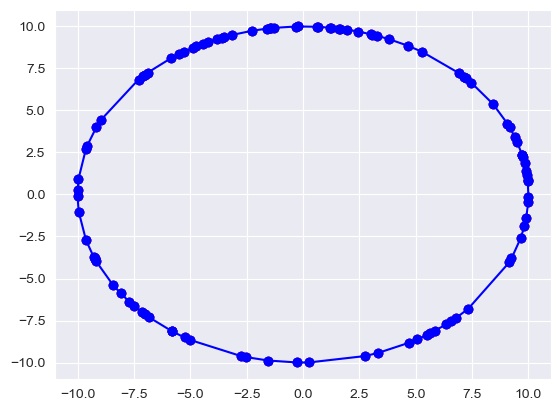

[[0.24943909268280118, -9.996888522887588],
 [2.746897965917112, -9.615328988903105],
 [3.326260150675532, -9.430588179431227],
 [4.721203764510143, -8.815340890400963],
 [5.063416260554591, -8.623329738120383],
 [5.493802477699134, -8.35572464457912],
 [5.6356807537680425, -8.260696244361517],
 [5.868120945328586, -8.097231413946123],
 [6.353048735534211, -7.722614308893535],
 [6.552091503592856, -7.554475291411462],
 [6.799198289327695, -7.332864557756631],
 [7.318398938337539, -6.814766098652248],
 [9.149010092056711, -4.036782671316904],
 [9.247028172228179, -3.806897684732069],
 [9.660598960190223, -2.5831817068049228],
 [9.821163985419602, -1.882747452925364],
 [9.903781068096523, -1.3838788079932829],
 [9.989582857021647, -0.4563270128967116],
 [9.998948506927851, -0.14501295047445428],
 [9.96935252682897, 0.7823108051208563],
 [9.963613761503034, 0.8522915062274051],
 [9.932425627719581, 1.1605693214191335],
 [9.905342865293317, 1.372655354042953],
 [9.825562157505766, 1.859658

In [29]:
graham(data_b,True)

### Algorytm Jarvisa

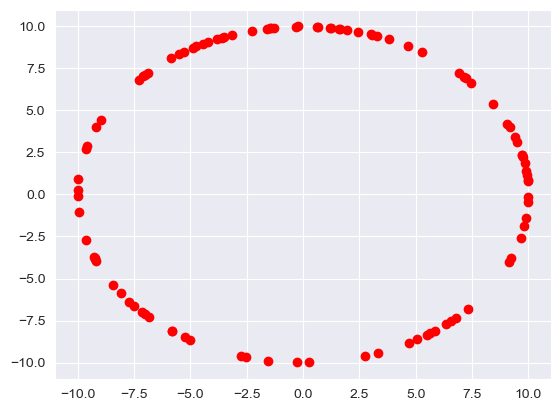

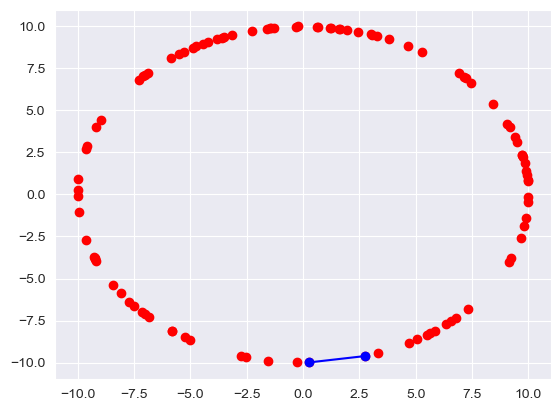

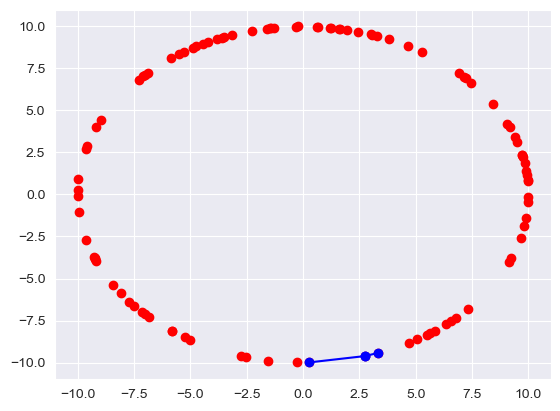

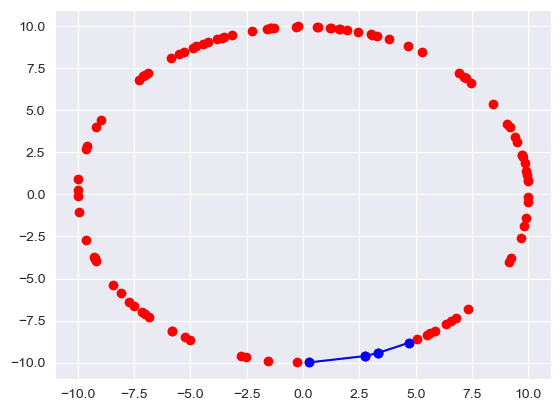

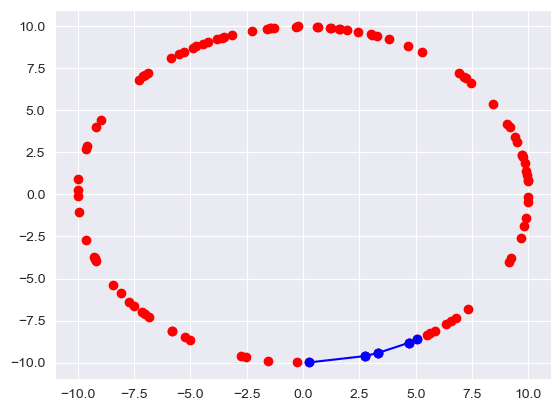

...

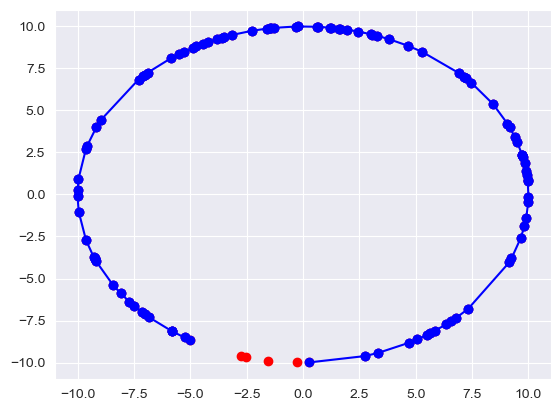

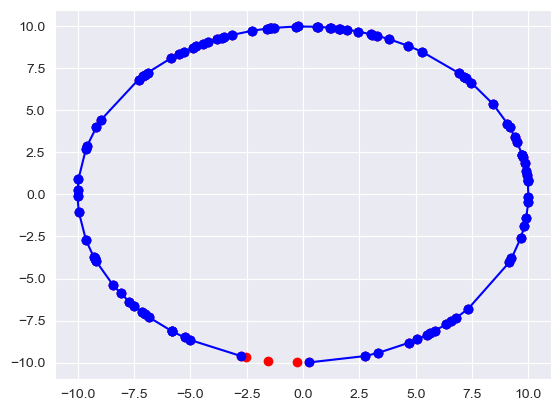

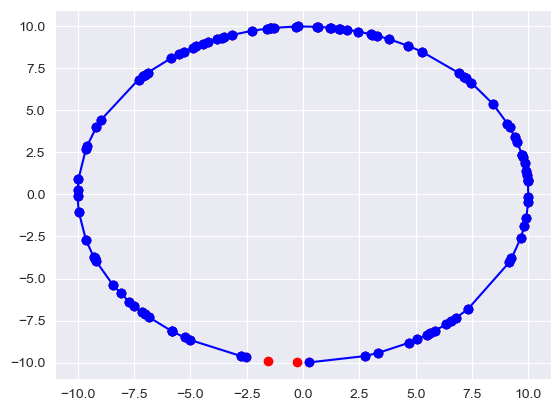

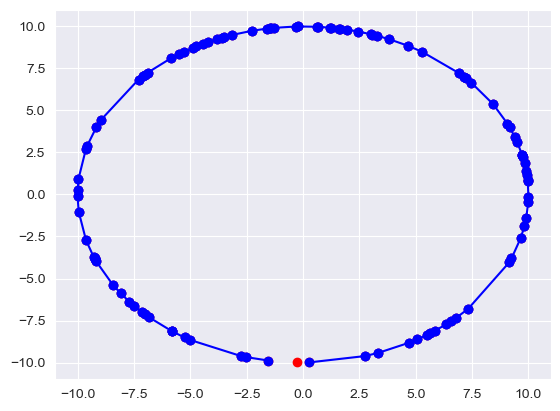

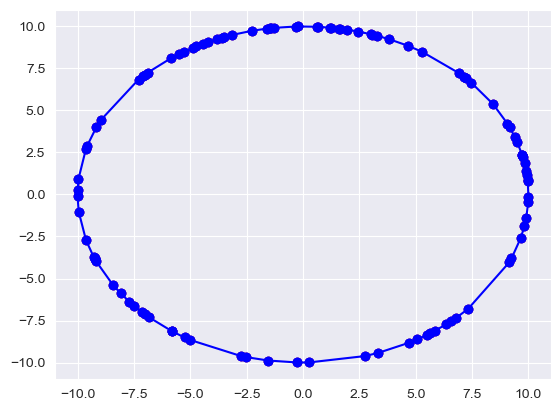

[[0.24943909268280118, -9.996888522887588],
 [2.746897965917112, -9.615328988903105],
 [3.326260150675532, -9.430588179431227],
 [4.721203764510143, -8.815340890400963],
 [5.063416260554591, -8.623329738120383],
 [5.493802477699134, -8.35572464457912],
 [5.6356807537680425, -8.260696244361517],
 [5.868120945328586, -8.097231413946123],
 [6.353048735534211, -7.722614308893535],
 [6.552091503592856, -7.554475291411462],
 [6.799198289327695, -7.332864557756631],
 [7.318398938337539, -6.814766098652248],
 [9.149010092056711, -4.036782671316904],
 [9.247028172228179, -3.806897684732069],
 [9.660598960190223, -2.5831817068049228],
 [9.821163985419602, -1.882747452925364],
 [9.903781068096523, -1.3838788079932829],
 [9.989582857021647, -0.4563270128967116],
 [9.998948506927851, -0.14501295047445428],
 [9.96935252682897, 0.7823108051208563],
 [9.963613761503034, 0.8522915062274051],
 [9.932425627719581, 1.1605693214191335],
 [9.905342865293317, 1.372655354042953],
 [9.825562157505766, 1.859658

In [30]:
jarvis(data_b,True)

## Zbiór C

### Algorym Grahama

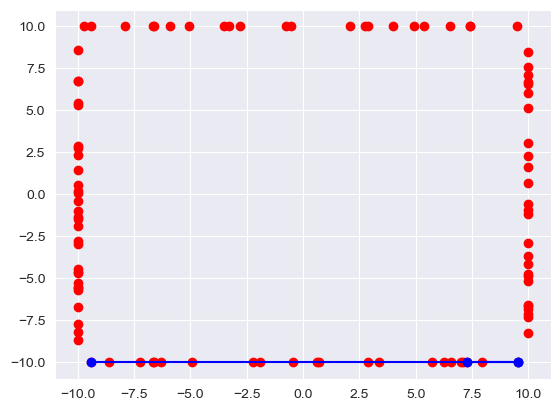

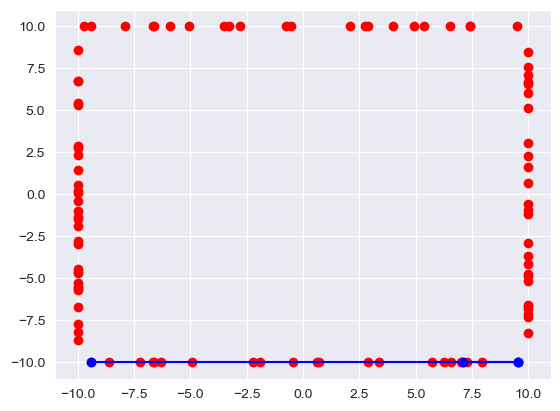

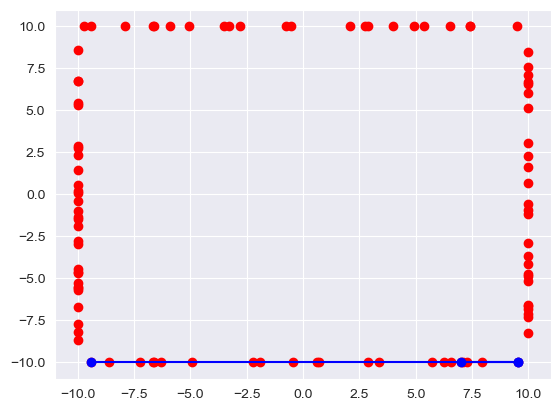

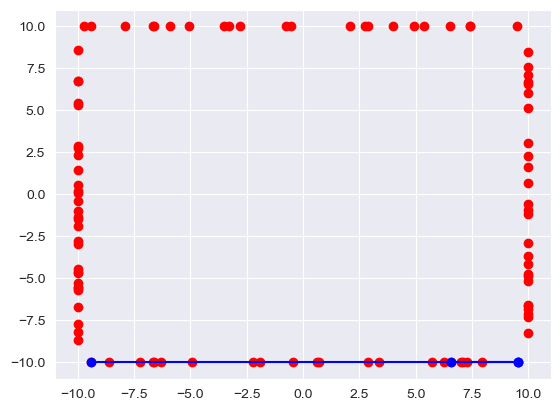

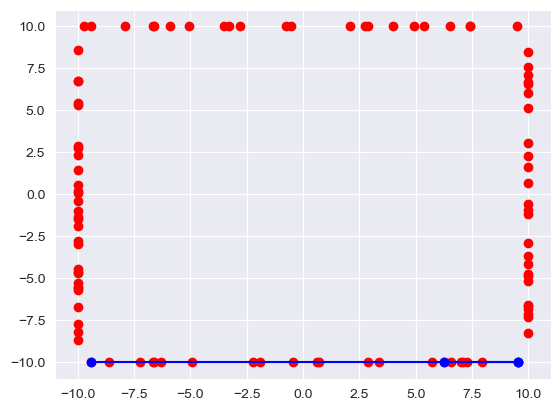

...

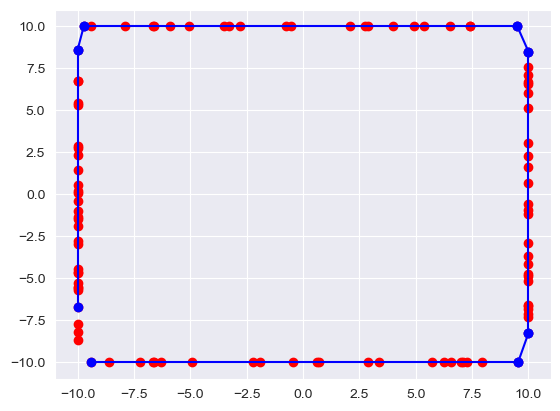

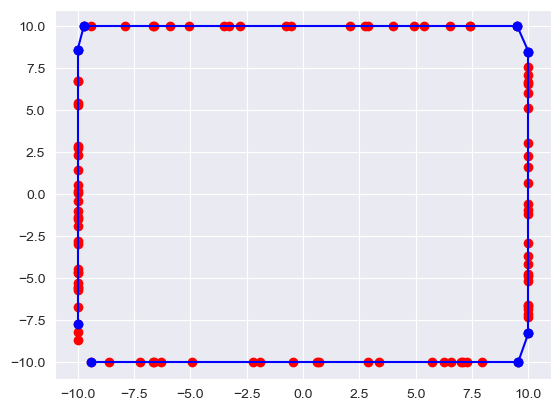

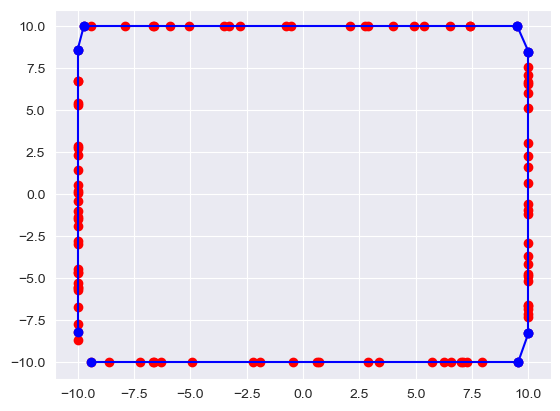

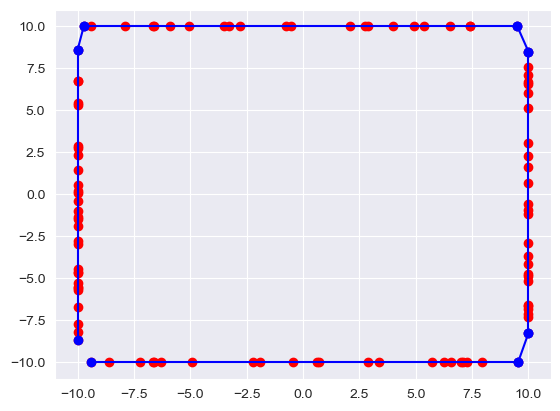

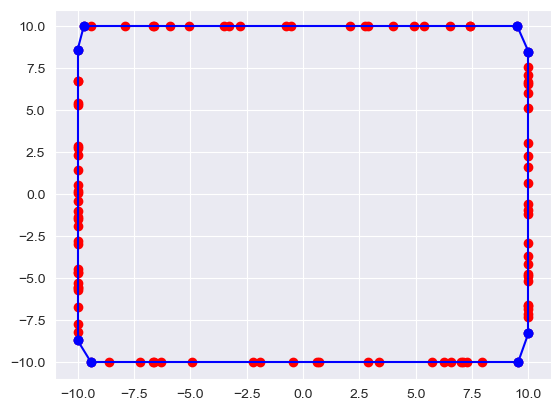

[[-9.394768243662433, -10],
 [9.537326412537602, -10],
 [10, -8.25513106977244],
 [10, 8.50790863771195],
 [9.508962914688052, 10],
 [-9.724009449796469, 10],
 [-10, 8.600429170028768],
 [-10, -8.674378054601528]]

In [31]:
graham(data_c,True)

### Algorytm Jarvisa

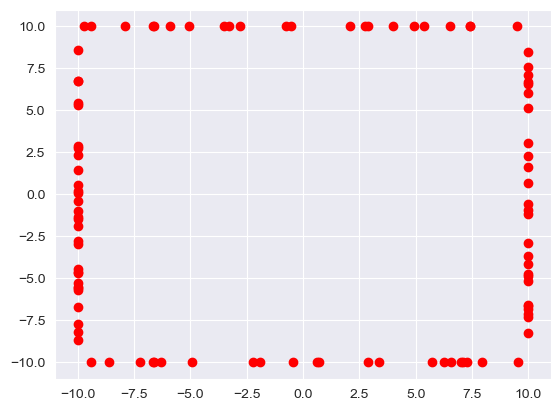

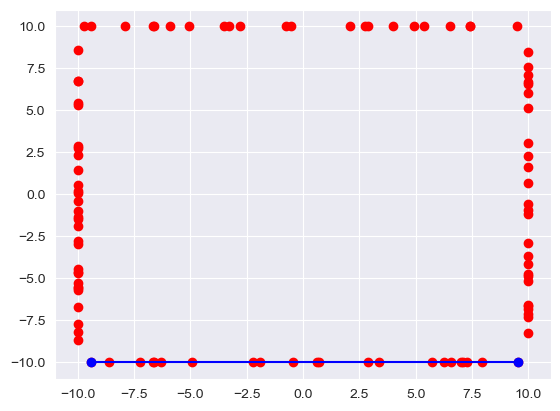

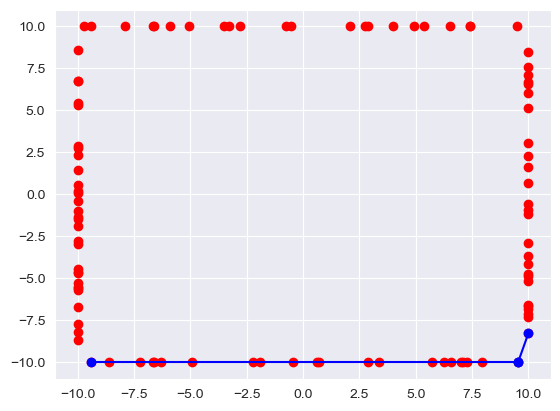

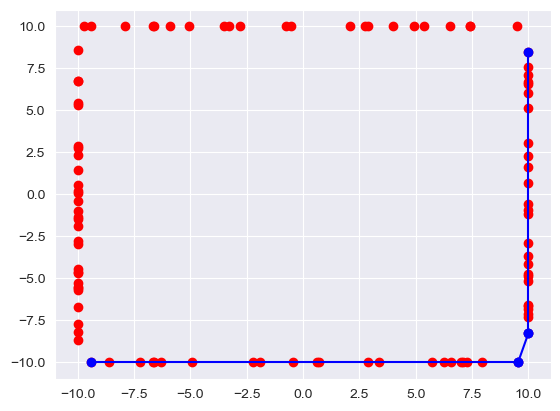

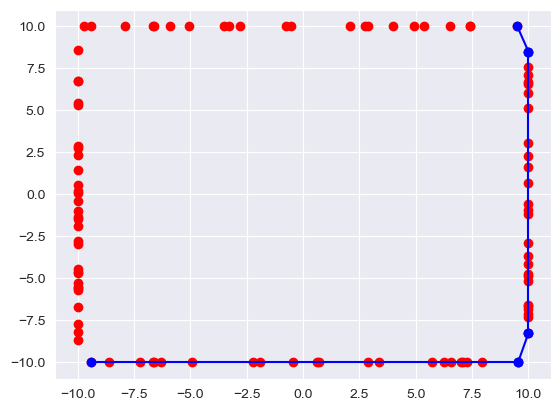

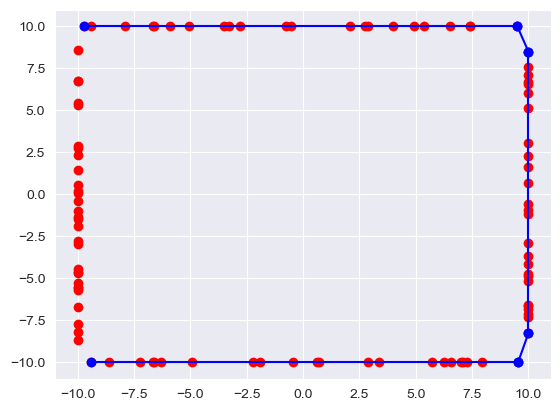

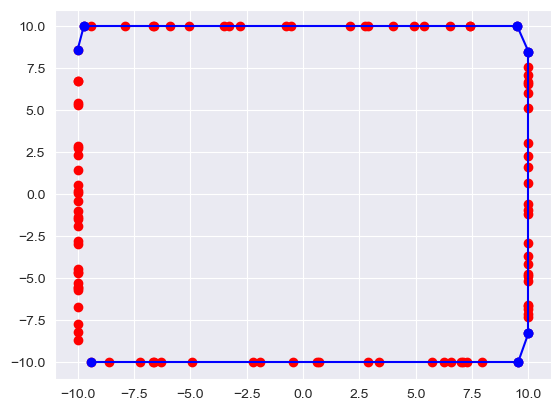

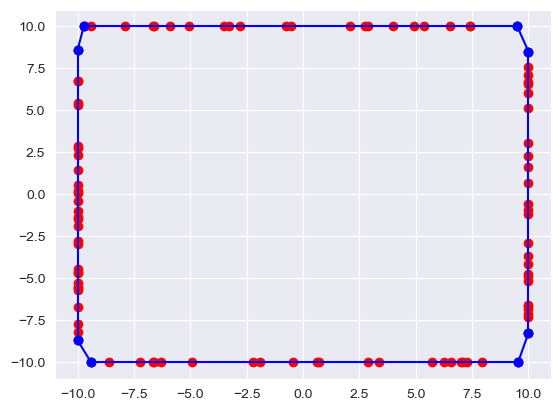

[[-9.394768243662433, -10],
 [9.537326412537602, -10],
 [10, -8.25513106977244],
 [10, 8.50790863771195],
 [9.508962914688052, 10],
 [-9.724009449796469, 10],
 [-10, 8.600429170028768],
 [-10, -8.674378054601528]]

In [32]:
jarvis(data_c,True)

## Zbiór D

### Algorym Grahama

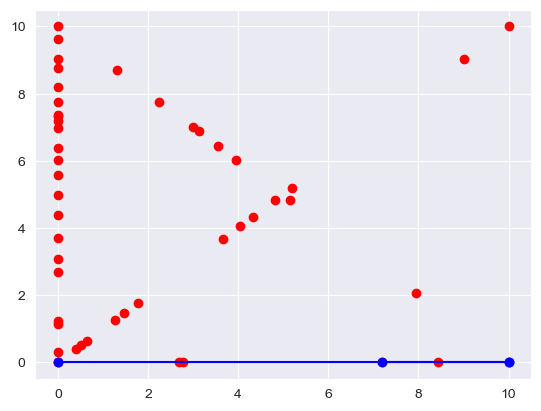

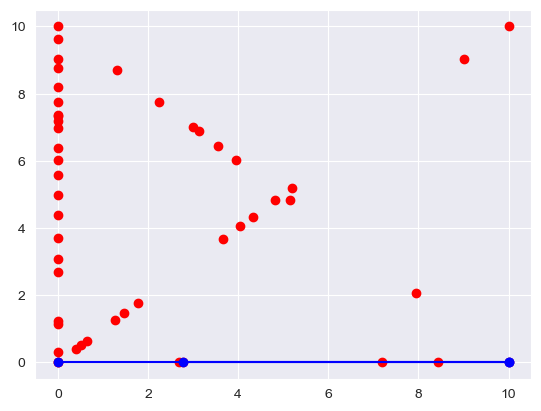

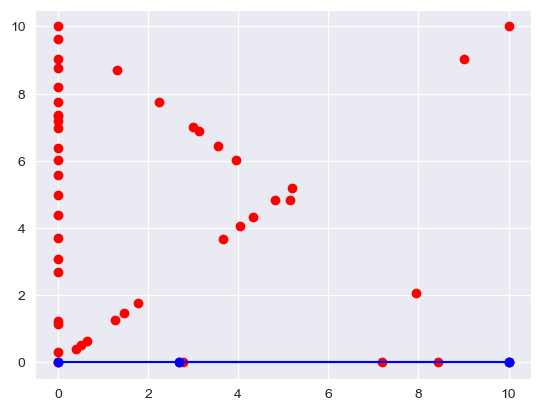

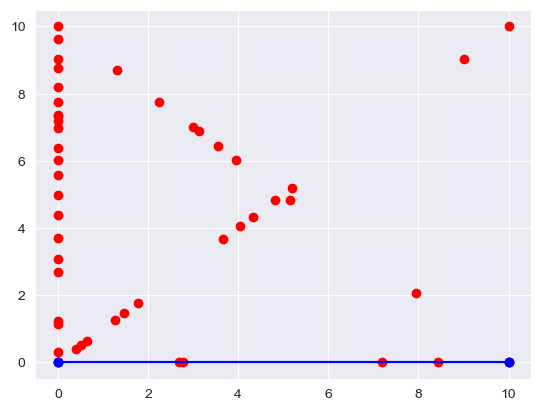

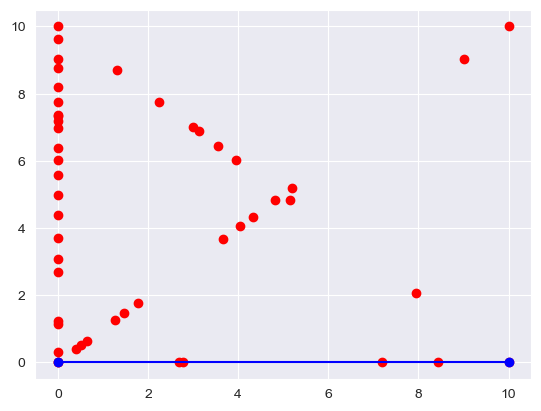

...

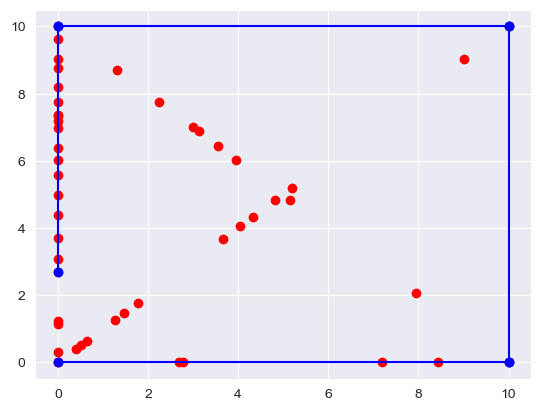

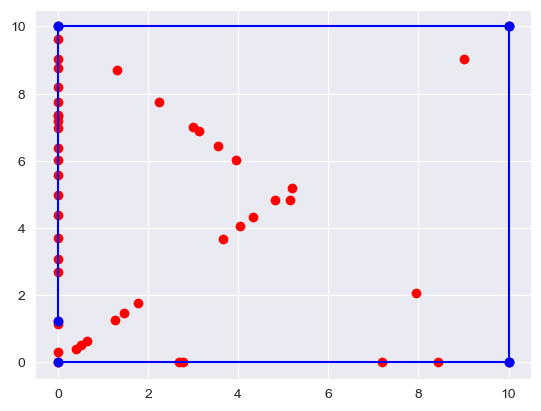

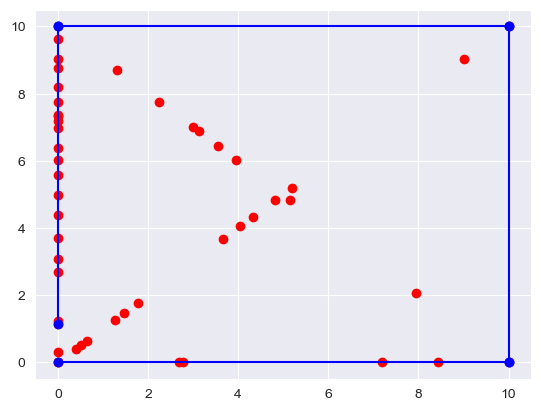

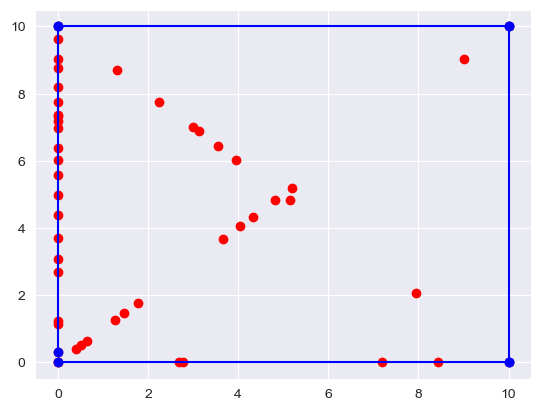

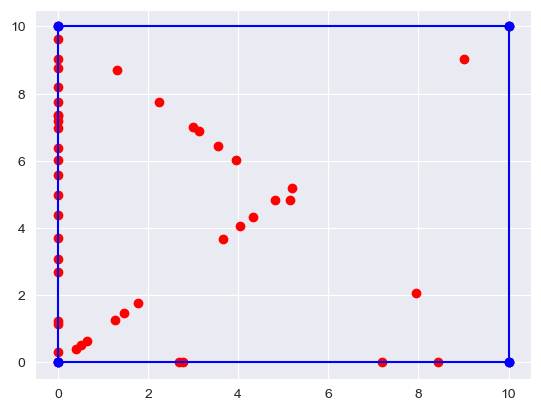

[[0, 0], [10, 0], [10, 10], [0, 10]]

In [33]:
graham(data_d,True)

### Algorytm Jarvisa

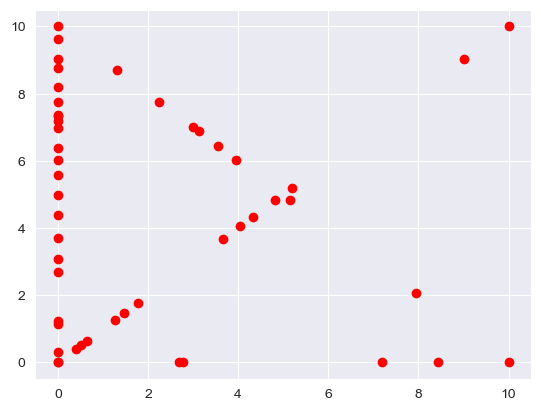

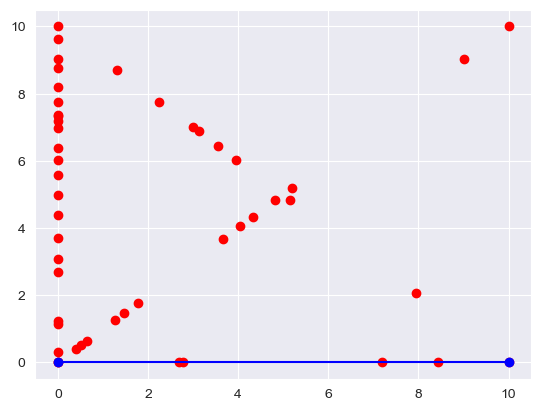

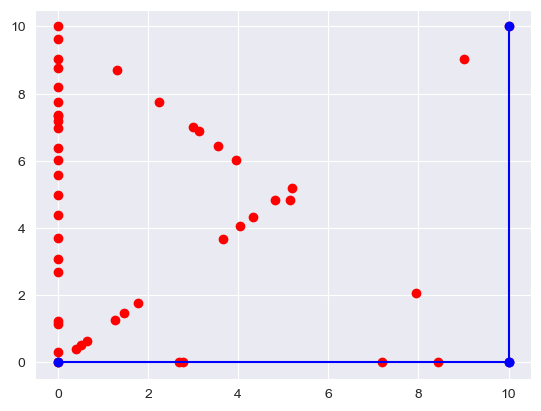

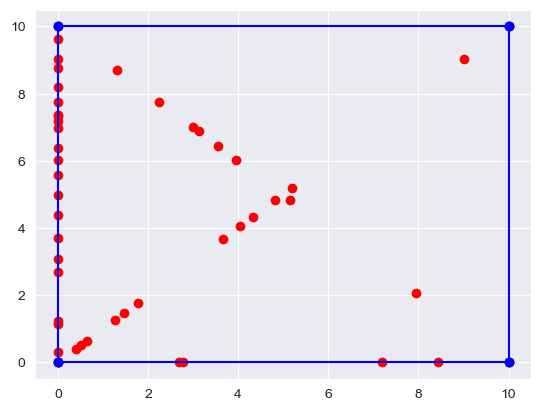

[[0, 0], [10, 0], [10, 10], [0, 10]]

In [34]:
jarvis(data_d,True)

# Implementuję algorytmy bez wizulaizacji kolejnych kroków

## Graham:

In [35]:
def graham_clear(points_org):
    
    points = deepcopy(points_org)  # kopijuę otrzymane punkty, deepcopy ze względu na dwuwymiarowość otrzymanej listy
    
    min_point = min(points, key = lambda x : (x[1], x[0]))  # szukam minimalnego punktu
    
    points.remove(min_point)
    
    quick_sort(points, min_point, 0, len(points)-1)   #sortuję punkty quick sortem mojej implementacji
    points = [min_point] + points
    
    stack = []    #wrzucam trzy punkty do stosu
    stack.append(points[0])
    stack.append(points[1])
    stack.append(points[2])
    
    i=3
    m=len(points)
    
    while(i<m):    # wykonuję krok 4 algorytmu Grahama, korzystając z wcześniejszego posortowania punktów
        if(orient(stack[-2],stack[-1],points[i])==0):
            stack.pop()
            stack.append(points[i])
            i+=1
        elif(orient(stack[-2],stack[-1],points[i])==1):
            stack.append(points[i])
            i+=1
        else:
            stack.pop()
            
    if(orient(stack[-2],stack[-1],min_point)==0):
        stack.pop()
        
    return stack

## Jarvis:

In [36]:
def jarvis_clear(points):
    points_cpy = deepcopy(points)
    
    min_point = min(points, key = lambda x : (x[1], x[0]))   #znajduję punkt od którego zaczynamy
    
    hull =[min_point]
    
    point_1 = min_point    #wykonuję algorytm Jarvisa
    point_2 = min_point
    point_3 = None
    while True:
        for i in range(len(points_cpy)):
            point_3 = points_cpy[i]
            if point_3 == point_2:
                continue
            if orient(point_1,point_2,point_3)==-1 :
                point_2=point_3
            elif orient(point_1,point_2,point_3)==0 and dist(point_1,point_2)<dist(point_1,point_3):  # punkty porównuję wyznacznikiem,a jeśli leżą na jednej liniii to sprawdzam ich odległości
                point_2=point_3
        if(hull[0]==point_2):
            break
        else:
            hull.append(point_2)
            point_1=point_2
            
    return hull    

# Podsumowanie czasów dla obu algorytmów, dla wszystkich zbiorów

In [37]:
def count_time(algorithm,points):
    start = perf_counter()
    algorithm(points)
    end = perf_counter()
    time = end - start
    return time

## Zbiór A

In [40]:
def time_comparison_on_the_range():
    columns =["Liczba punktów","Początek zakresu","Koniec zakresu","Czas algorytmu Grahama |s|","Czas algorytmu Jarvisa |s|",
             "Szybszy algorytm","Róznica czasu |s|"]
    num_of_points = [500,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000]
    data = []
    for i in range(len(num_of_points)):
        points_range = [-200,200]
        dataA=data_a_parameters(num_of_points[i],points_range)
        graham_time = count_time(graham_clear,dataA.tolist())
        jarvis_time = count_time(jarvis_clear,dataA.tolist())
        if(graham_time < jarvis_time):
            faster_algorithm = "Algorytm Grahama"
        else:
            faster_algorithm = "Algorytm Jarvisa"
        time_comparison = abs(graham_time - jarvis_time)
        data.append((num_of_points[i],points_range[0],points_range[1],graham_time,jarvis_time,faster_algorithm,time_comparison))
    return pd.DataFrame(data=data, columns = columns)

In [50]:
time_comparison_df_a = time_comparison_on_the_range()
time_comparison_df_a

,Liczba punktów,Początek zakresu,Koniec zakresu,Czas algorytmu Grahama |s|,Czas algorytmu Jarvisa |s|,Szybszy algorytm,Róznica czasu |s|
0,500,-200,200,0.121606,0.039185,Algorytm Jarvisa,0.082421
1,1000,-200,200,0.023525,0.043218,Algorytm Grahama,0.019693
2,2000,-200,200,0.072527,0.084485,Algorytm Grahama,0.011958
3,3000,-200,200,0.079784,0.129780,Algorytm Grahama,0.049996
4,4000,-200,200,0.106849,0.186710,Algorytm Grahama,0.079862
5,5000,-200,200,0.136786,0.300265,Algorytm Grahama,0.163479
6,6000,-200,200,0.174955,0.317975,Algorytm Grahama,0.143021
7,7000,-200,200,0.237779,0.358708,Algorytm Grahama,0.120929
8,8000,-200,200,0.317260,0.412693,Algorytm Grahama,0.095433
9,9000,-200,200,0.247849,0.430981,Algorytm Grahama,0.183132


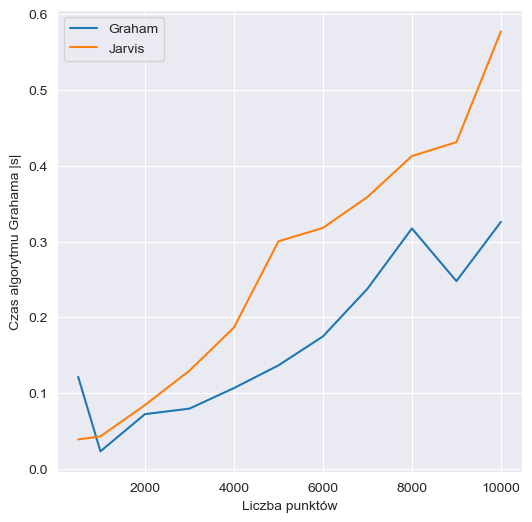

In [51]:
x = "Liczba punktów"
y_1 = "Czas algorytmu Grahama |s|"
y_2 = "Czas algorytmu Jarvisa |s|"
plt.figure(figsize=(6,6))
sns.lineplot(data=time_comparison_df_a,x=x,y=y_1, label='Graham')
sns.lineplot(data=time_comparison_df_a,x=x,y=y_2, label='Jarvis')
plt.legend(loc="best")

## Zbiór B

In [47]:

def time_comparison_on_the_circle():
    data=[]
    columns =["Liczba punktów","Środek okręgu","Promień","Czas algorytmu Grahama |s|","Czas algorytmu Jarvisa |s|",
         "Szybszy algorytm","Róznica czasu |s|"]
    
    for i in range(5,12):
        middle = [np.random.uniform(-20,20),np.random.uniform(-20,20)]
        radius = np.random.uniform(1,20)
        num_of_points = i*100
        dataB=data_b_parameters(num_of_points,middle,radius)
        graham_time = count_time(graham_clear,dataB)
        jarvis_time = count_time(jarvis_clear,dataB)
        if(graham_time < jarvis_time):
            faster_algorithm = "Algorytm Grahama"
        else:
            faster_algorithm = "Algorytm Jarvisa"
        time_comparison = abs(graham_time - jarvis_time)
        data.append((num_of_points,middle,radius,graham_time,jarvis_time,faster_algorithm,time_comparison))
    
    return pd.DataFrame(data=data, columns=columns)

        

In [48]:
time_comparison_df_b = time_comparison_on_the_circle()
time_comparison_df_b

,Liczba punktów,Środek okręgu,Promień,Czas algorytmu Grahama |s|,Czas algorytmu Jarvisa |s|,Szybszy algorytm,Róznica czasu |s|
0,500,"[6.884413533741913, 1.7976215878499815]",7.501332,0.044458,1.488659,Algorytm Grahama,1.444201
1,600,"[13.204509881313427, 19.6958979602133]",18.753506,0.033814,2.105393,Algorytm Grahama,2.071579
2,700,"[4.23056914085112, -2.3328397842838697]",10.885811,0.037286,3.265869,Algorytm Grahama,3.228584
3,800,"[3.6406443908241855, -14.092603931249288]",3.320629,0.054227,4.900251,Algorytm Grahama,4.846023
4,900,"[-18.208196633420325, -18.037090578408595]",4.163666,0.056018,6.541791,Algorytm Grahama,6.485773
5,1000,"[0.9228617442479177, -8.56941446455144]",5.608486,0.058621,8.004932,Algorytm Grahama,7.946311
6,1100,"[15.010236818827721, 16.91894857311234]",9.457401,0.068384,7.176217,Algorytm Grahama,7.107833


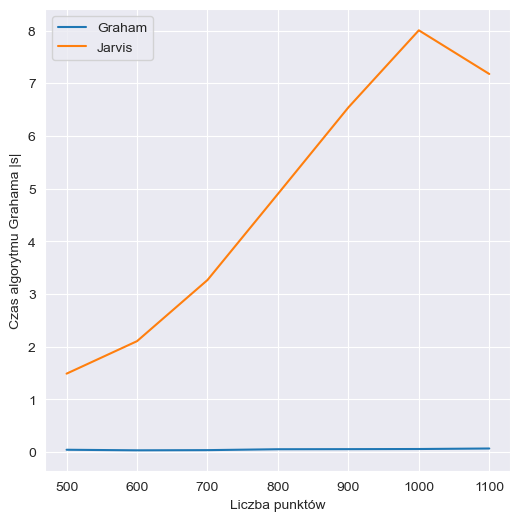

In [49]:
x = "Liczba punktów"
y_1 = "Czas algorytmu Grahama |s|"
y_2 = "Czas algorytmu Jarvisa |s|"
plt.figure(figsize=(6,6))
sns.lineplot(data=time_comparison_df_b,x=x,y=y_1, label='Graham')
sns.lineplot(data=time_comparison_df_b,x=x,y=y_2, label='Jarvis')
plt.legend(loc="best")

## Zbiór C

In [42]:
def time_comparison_on_the_rectangle():
    data = []
    columns =["Liczba punktów","Wierzchołki prostokątu","Czas algorytmu Grahama |s|","Czas algorytmu Jarvisa |s|",
     "Szybszy algorytm","Róznica czasu |s|"]
    num_of_points = [1000,2000,3000,4000,5000,6000,7000,8000,9000,10000,11000,12000]
    data = []
    for i in range(len(num_of_points)):
        x1=np.random.randint(-60,70)
        x2=np.random.randint(-60,70)
        y1=np.random.randint(-60,70)
        y2=np.random.randint(-60,70)
        vertex=[(x1,y1),(x1,y2),(x2,y1),(x2,y2)]
        if(x1>x2):
            x1,x2=x2,x1
        if(y1>y2):
            y1,y2=y2,y1
        dataC=data_c_parameters(num_of_points[i],[x1,y1],[x2,y2])
        graham_time = count_time(graham_clear,dataC)
        jarvis_time = count_time(jarvis_clear,dataC)
        if(graham_time < jarvis_time):
            faster_algorithm = "Algorytm Grahama"
        else:
            faster_algorithm = "Algorytm Jarvisa"
        time_comparison = abs(graham_time - jarvis_time)
        data.append((num_of_points[i],vertex,graham_time,jarvis_time,faster_algorithm,time_comparison))
    return pd.DataFrame(data=data, columns=columns)

In [45]:
time_comparison_df_c = time_comparison_on_the_rectangle()
time_comparison_df_c

,Liczba punktów,Wierzchołki prostokątu,Czas algorytmu Grahama |s|,Czas algorytmu Jarvisa |s|,Szybszy algorytm,Róznica czasu |s|
0,1000,"[(-43, 33), (-43, -22), (-17, 33), (-17, -22)]",0.039822,0.021359,Algorytm Jarvisa,0.018463
1,2000,"[(21, -34), (21, -58), (11, -34), (11, -58)]",0.053789,0.040345,Algorytm Jarvisa,0.013444
2,3000,"[(-48, 16), (-48, 49), (-38, 16), (-38, 49)]",0.095493,0.066946,Algorytm Jarvisa,0.028547
3,4000,"[(-13, 41), (-13, 22), (-21, 41), (-21, 22)]",0.119846,0.079374,Algorytm Jarvisa,0.040472
4,5000,"[(19, -46), (19, -21), (49, -46), (49, -21)]",0.196522,0.099709,Algorytm Jarvisa,0.096813
5,6000,"[(43, -34), (43, 66), (-6, -34), (-6, 66)]",0.242962,0.146164,Algorytm Jarvisa,0.096798
6,7000,"[(-55, -26), (-55, -60), (-23, -26), (-23, -60)]",0.289303,0.139233,Algorytm Jarvisa,0.150070
7,8000,"[(-39, -39), (-39, 69), (-15, -39), (-15, 69)]",0.258534,0.161777,Algorytm Jarvisa,0.096758
8,9000,"[(-13, 68), (-13, -29), (19, 68), (19, -29)]",0.320582,0.302918,Algorytm Jarvisa,0.017665
9,10000,"[(-24, 25), (-24, 65), (-28, 25), (-28, 65)]",0.504276,0.423860,Algorytm Jarvisa,0.080416


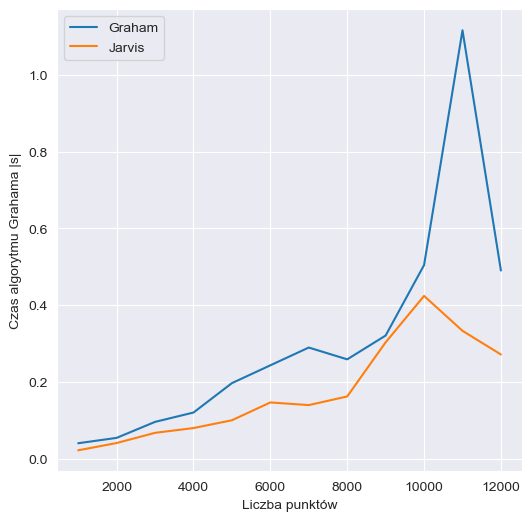

In [46]:
x = "Liczba punktów"
y_1 = "Czas algorytmu Grahama |s|"
y_2 = "Czas algorytmu Jarvisa |s|"
plt.figure(figsize=(6,6))
sns.lineplot(data=time_comparison_df_c,x=x,y=y_1, label='Graham')
sns.lineplot(data=time_comparison_df_c,x=x,y=y_2, label='Jarvis')
plt.legend(loc="best")

## Zbiór D

In [52]:
def time_comparison_on_the_square():
    axis_points = [50,100,200,300,400,500,600,700,800,900,1000,1100,1200,1300]
    data = []
    columns =["Liczba punktów na boku","Liczba punktów na przekątnej","Wierzchołki","Czas algorytmu Grahama |s|","Czas algorytmu Jarvisa |s|",
             "Szybszy algorytm","Róznica czasu |s|"]
    for i in range(len(axis_points)):
        x=np.random.randint(-50,40)
        y=np.random.randint(-50,40)
        side=np.random.randint(10,90)
        vertex = [(x,y),(x,y+side),(x+side,y+side),(x+side,y)]
        dataD=data_d_parameters([[x,y],[x,y+side],[x+side,y+side],[x+side,y]],axis_points[i],axis_points[i]//2)
        graham_time = count_time(graham_clear,dataD)
        jarvis_time = count_time(jarvis_clear,dataD)
        if(graham_time < jarvis_time):
            faster_algorithm = "Algorytm Grahama"
        else:
            faster_algorithm = "Algorytm Jarvisa"
        time_comparison = abs(graham_time - jarvis_time)
        data.append((axis_points[i],axis_points[i]//2,vertex,graham_time,jarvis_time,faster_algorithm,time_comparison))
    return pd.DataFrame(data=data, columns=columns)

In [55]:
time_comparison_df_d = time_comparison_on_the_square()
time_comparison_df_d

,Liczba punktów na boku,Liczba punktów na przekątnej,Wierzchołki,Czas algorytmu Grahama |s|,Czas algorytmu Jarvisa |s|,Szybszy algorytm,Róznica czasu |s|
0,50,25,"[(-29, 34), (-29, 92), (29, 92), (29, 34)]",0.002015,0.001718,Algorytm Jarvisa,0.000297
1,100,50,"[(-9, -44), (-9, 13), (48, 13), (48, -44)]",0.005836,0.004241,Algorytm Jarvisa,0.001595
2,200,100,"[(8, 22), (8, 53), (39, 53), (39, 22)]",0.010163,0.006638,Algorytm Jarvisa,0.003525
3,300,150,"[(24, -39), (24, 46), (109, 46), (109, -39)]",0.018329,0.011040,Algorytm Jarvisa,0.007288
4,400,200,"[(31, 24), (31, 43), (50, 43), (50, 24)]",0.020945,0.012202,Algorytm Jarvisa,0.008743
5,500,250,"[(-18, -13), (-18, 34), (29, 34), (29, -13)]",0.024689,0.011012,Algorytm Jarvisa,0.013677
6,600,300,"[(20, -9), (20, 16), (45, 16), (45, -9)]",0.024510,0.015059,Algorytm Jarvisa,0.009451
7,700,350,"[(-19, 12), (-19, 51), (20, 51), (20, 12)]",0.028883,0.013819,Algorytm Jarvisa,0.015065
8,800,400,"[(-8, 31), (-8, 64), (25, 64), (25, 31)]",0.032261,0.019520,Algorytm Jarvisa,0.012742
9,900,450,"[(-35, 6), (-35, 44), (3, 44), (3, 6)]",0.038242,0.020159,Algorytm Jarvisa,0.018083


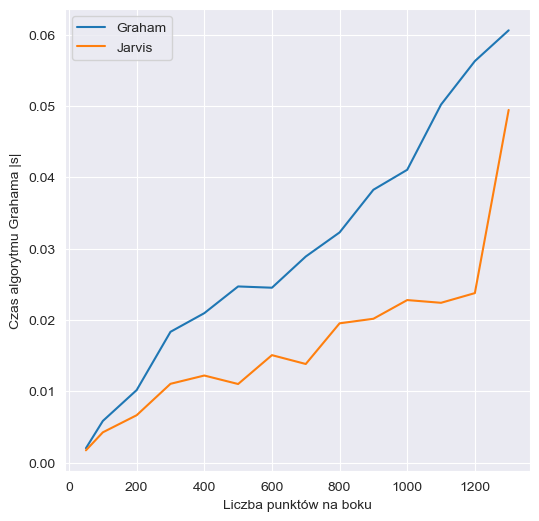

In [56]:
x = "Liczba punktów na boku"
y_1 = "Czas algorytmu Grahama |s|"
y_2 = "Czas algorytmu Jarvisa |s|"
plt.figure(figsize=(6,6))
sns.lineplot(data=time_comparison_df_d,x=x,y=y_1, label='Graham')
sns.lineplot(data=time_comparison_df_d,x=x,y=y_2, label='Jarvis')
plt.legend(loc="best")